In [15]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Initialize an empty list to store the dataframes
dataframes = []

# Specify the directory containing the CSV files
directory_path = "../DATASETS/CSE_DATA/SHARE_CHANGE/"

filenames = [os.path.join(directory_path, file) for file in os.listdir(directory_path) if file.endswith('.csv')]

# Initialize an empty DataFrame to store the data
data = pd.DataFrame()

# Loop through the CSV files and read them into DataFrames
for file in filenames:
    df = pd.read_csv(file)
    # Extract the label from the file name and remove the '.csv' extension
    label = os.path.basename(file).replace('.csv', '')
    # Add the label as a new column
    df['Label'] = label
    dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_df = pd.concat(dataframes, ignore_index=True)


# Convert 'Trade Date' to datetime format
combined_df['Trade Date'] = pd.to_datetime(combined_df['Trade Date'], format='%m/%d/%y')
print(combined_df)
# Extract 'Month' and 'Year' from 'Trade Date'
combined_df['Month'] = combined_df['Trade Date'].dt.month
combined_df['Year'] = combined_df['Trade Date'].dt.year

# Select the columns 'Label', 'Month', 'Year', and 'Close (Rs.)'
selected_columns = ['Label', 'Month', 'Year', 'Close (Rs.)']

# Group by 'Label', 'Month', and 'Year' and calculate the mean value of 'Close (Rs.)'
result_df = combined_df[selected_columns].groupby(['Label', 'Month', 'Year']).mean().reset_index()

# Sort the DataFrame by 'Year' and 'Month'
result_df = result_df.sort_values(by=['Year', 'Month'])
print(result_df)

# Group by 'Label' and sum the 'ShareVolume' and 'Turnover (Rs.)'
grouped_df = combined_df.groupby('Label').agg({'ShareVolume': 'sum', 'Turnover (Rs.)': 'sum'})

# Reset the index to convert the 'Label' back into a column
grouped_df = grouped_df.reset_index()

# Select only the non-duplicated labels
non_duplicated_labels = grouped_df.drop_duplicates(subset='Label')

# Select only the 'Label' column
selected_labels = non_duplicated_labels['Label']

print(selected_labels)

# Reset the index for the result DataFrame
result_df = result_df.reset_index(drop=True)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(120, 90))

# Get a list of unique labels
unique_labels = result_df['Label'].unique()

# Create a separate line for each label and label it
for label in unique_labels:
    # Filter the data for the current label
    label_data = result_df[result_df['Label'] == label]

    # Calculate a decimal year for x-axis
    decimal_year = label_data['Year'] + label_data['Month'] / 12

    # Plot the data for the current label and label it with the label name
    ax.plot(decimal_year, label_data['Close (Rs.)'], label=label)
    ax.text(decimal_year.iloc[-1], label_data['Close (Rs.)'].iloc[-1], label, fontsize=2, va='center')

# Customize the plot (labels, title, etc.)
ax.set_xlabel('Year')
ax.set_ylabel('Close (Rs.)')
ax.set_title('Close (Rs.) for Different Labels')

# Show the plot
plt.grid(True)
plt.show()

       Trade Date  Open (Rs.)  High (Rs.)  Low (Rs.)  Close (Rs.) TradeVolume  \
0      2023-05-03     1120.75     1128.75    1120.75      1120.25           9   
1      2023-05-02     1128.75     1128.75    1115.25      1120.25          32   
2      2023-04-28     1130.00     1134.75    1110.00      1129.75          18   
3      2023-04-27     1134.75     1134.75    1120.00      1122.75          38   
4      2023-04-26     1105.00     1130.00    1105.00      1126.00          26   
...           ...         ...         ...        ...          ...         ...   
630055 2023-07-21        2.40        2.40       2.20         2.30          14   
630056 2023-07-20        2.30        2.40       2.20         2.30          21   
630057 2023-07-19        2.20        2.20       2.10         2.20          18   
630058 2023-07-18        2.40        2.40       2.30         2.30           7   
630059 2023-07-17        2.30        2.40       2.20         2.20          11   

       ShareVolume  Turnove

In [16]:
import pandas as pd
import os

# Initialize an empty list to store the dataframes
dataframes = []

# Specify the directory containing the CSV files
directory_path = "../DATASETS/CSE_DATA/SHARE_CHANGE/"

filenames = [os.path.join(directory_path, file) for file in os.listdir(directory_path) if file.endswith('.csv')]

# Initialize an empty DataFrame to store the data
data = pd.DataFrame()

# Loop through the CSV files and read them into DataFrames
for file in filenames:
    df = pd.read_csv(file)
    # Extract the label from the file name and remove the '.csv' extension
    label = os.path.basename(file).replace('.csv', '')
    # Add the label as a new column
    df['Label'] = label
    dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_df = pd.concat(dataframes, ignore_index=True)

# Filter out data associated with the label 'SWAD.N0000'
combined_df = combined_df[combined_df['Label'] != 'SWAD.N0000']

# Convert 'Trade Date' to datetime format
combined_df['Trade Date'] = pd.to_datetime(combined_df['Trade Date'], format='%m/%d/%y')

# Extract 'Month' and 'Year' from 'Trade Date'
combined_df['Month'] = combined_df['Trade Date'].dt.month
combined_df['Year'] = combined_df['Trade Date'].dt.year

# Select the columns 'Label', 'Month', 'Year', and 'Close (Rs.)'
selected_columns = ['Label', 'Month', 'Year', 'Close (Rs.)']

# Group by 'Label', 'Month', and 'Year' and calculate the mean value of 'Close (Rs.)'
result_df = combined_df[selected_columns].groupby(['Label', 'Month', 'Year']).mean().reset_index()

# Sort the DataFrame by 'Year' and 'Month'
result_df = result_df.sort_values(by=['Year', 'Month'])

# Reset the index for the result DataFrame
result_df = result_df.reset_index(drop=True)

print(result_df)

            Label  Month  Year  Close (Rs.)
0       JKH.N0000      8  1986     0.000000
1       SUN.N0000      3  1990    12.500000
2      GREG.N0000      4  1990     0.500000
3      SELI.N0000      1  1991   550.000000
4      SHAL.N0000      2  1991   575.000000
...           ...    ...   ...          ...
40419  VPEL.N0000     10  2023     6.850000
40420  WAPO.N0000     10  2023    31.410000
40421  WATA.N0000     10  2023    74.180000
40422  WIND.N0000     10  2023    18.620000
40423  YORK.N0000     10  2023   161.357143

[40424 rows x 4 columns]


In [17]:
# Export the DataFrame to a CSV file
result_df.to_csv('output_monthly_stock_value_change.csv', index=False)  # 'output.csv' is the output file name

print("CSV file exported successfully.")

CSV file exported successfully.


In [18]:
# Filter result_df to include only data from January 2000 to September 2023
filtered_result_df = result_df[
    (result_df['Year'] >= 2000) &
    ((result_df['Year'] < 2023) | ((result_df['Year'] == 2023) & (result_df['Month'] <= 8)))
]

print(filtered_result_df)

            Label  Month  Year  Close (Rs.)
6073    ACL.N0000      1  2000    49.250000
6074   ARPI.N0000      1  2000    12.500000
6075   ASIR.N0000      1  2000    34.083333
6076    BFL.N0000      1  2000     8.821429
6077    BHR.N0000      1  2000    18.375000
...           ...    ...   ...          ...
39864  VPEL.N0000      8  2023     6.980952
39865  WAPO.N0000      8  2023    31.795238
39866  WATA.N0000      8  2023    74.480952
39867  WIND.N0000      8  2023    18.395238
39868  YORK.N0000      8  2023   170.394737

[33796 rows x 4 columns]


In [19]:
import pandas as pd

# Read the 'Loan Rate' data from the CSV file
loan_rate_data = pd.read_csv('../DATASETS/FACTORS/BANK_LOAN_RATES_SRI_LANKA/loan_rates_result.csv')  # Replace 'loan_rates.csv' with the path to your file

# Merge the 'Loan Rate' data with your existing DataFrame
merged_df = pd.merge(filtered_result_df, loan_rate_data, on=['Year', 'Month'], how='left')

print(merged_df)

            Label  Month  Year  Close (Rs.)  Loan Rate
0       ACL.N0000      1  2000    49.250000      13.39
1      ARPI.N0000      1  2000    12.500000      13.39
2      ASIR.N0000      1  2000    34.083333      13.39
3       BFL.N0000      1  2000     8.821429      13.39
4       BHR.N0000      1  2000    18.375000      13.39
...           ...    ...   ...          ...        ...
33791  VPEL.N0000      8  2023     6.980952      12.00
33792  WAPO.N0000      8  2023    31.795238      12.00
33793  WATA.N0000      8  2023    74.480952      12.00
33794  WIND.N0000      8  2023    18.395238      12.00
33795  YORK.N0000      8  2023   170.394737      12.00

[33796 rows x 5 columns]


In [20]:
# Export the merged DataFrame to a CSV file
merged_df.to_csv('final_share_value_loan_rate.csv', index=False)  # 'merged_data.csv' is the output file name

print("CSV file exported successfully.")

CSV file exported successfully.


In [21]:
# Merge the 'Loan Rate' data with your existing DataFrame
merged_df = pd.merge(filtered_result_df, loan_rate_data, on=['Year', 'Month'], how='left')

# Group by 'Label' and calculate the Pearson correlation between 'Close (Rs.)' and 'Loan Rate'
correlation_df = merged_df.groupby('Label')[['Close (Rs.)', 'Loan Rate']].corr().iloc[0::2, -1].reset_index()
correlation_df = correlation_df.rename(columns={'Loan Rate': 'Pearson Correlation'})

print(correlation_df)

          Label      level_1  Pearson Correlation
0     AAF.N0000  Close (Rs.)                  NaN
1     AAF.R0000  Close (Rs.)            -0.408248
2    AAIC.N0000  Close (Rs.)            -0.196532
3    ABAN.N0000  Close (Rs.)                  NaN
4     ABL.N0000  Close (Rs.)                  NaN
..          ...          ...                  ...
445  VPEL.N0000  Close (Rs.)            -0.491296
446  WAPO.N0000  Close (Rs.)                  NaN
447  WATA.N0000  Close (Rs.)             0.018502
448  WIND.N0000  Close (Rs.)            -0.835955
449  YORK.N0000  Close (Rs.)                  NaN

[450 rows x 3 columns]


In [22]:
# Remove rows with NaN values in the 'Pearson Correlation' column
correlation_df = correlation_df.dropna(subset=['Pearson Correlation'])

print(correlation_df)

          Label      level_1  Pearson Correlation
1     AAF.R0000  Close (Rs.)            -0.408248
2    AAIC.N0000  Close (Rs.)            -0.196532
7     ACL.N0000  Close (Rs.)            -0.184713
9    ACME.R0000  Close (Rs.)            -0.305424
10    AEL.N0000  Close (Rs.)            -0.631051
..          ...          ...                  ...
442   VLL.N0000  Close (Rs.)             0.332001
444  VONE.N0000  Close (Rs.)            -0.009452
445  VPEL.N0000  Close (Rs.)            -0.491296
447  WATA.N0000  Close (Rs.)             0.018502
448  WIND.N0000  Close (Rs.)            -0.835955

[249 rows x 3 columns]


In [23]:
# Filter labels with strong positive or negative correlations (abs(Pearson Correlation) > 0.7)
significant_correlations = correlation_df[abs(correlation_df['Pearson Correlation']) > 0.7]

significant_correlations.to_csv('significant_correlations_share_value_loan_rate.csv', index=False)  # 'merged_data.csv' is the output file name

print(significant_correlations)

          Label      level_1  Pearson Correlation
20   AINV.N0000  Close (Rs.)            -0.752954
26   ALUF.R0000  Close (Rs.)             1.000000
29    AMF.R0000  Close (Rs.)            -1.000000
33   ARPI.R0000  Close (Rs.)            -1.000000
35   ASCO.R0000  Close (Rs.)            -0.999991
45    ATL.R0000  Close (Rs.)             0.962048
57    BIL.R0000  Close (Rs.)             1.000000
60    BLI.R0000  Close (Rs.)            -0.987633
74   CABO.R0000  Close (Rs.)             1.000000
128  COMB.R0001  Close (Rs.)             0.708326
140     CSF.W21  Close (Rs.)             0.745011
148   CWL.N0000  Close (Rs.)            -0.785527
158   DPL.R0000  Close (Rs.)            -1.000000
165   EML.N0000  Close (Rs.)            -0.896958
183     GREG.W3  Close (Rs.)             0.970613
184     GREG.W6  Close (Rs.)             0.949846
186   GSF.R0000  Close (Rs.)             1.000000
200   HNB.R0000  Close (Rs.)             1.000000
201   HNB.R0001  Close (Rs.)             1.000000


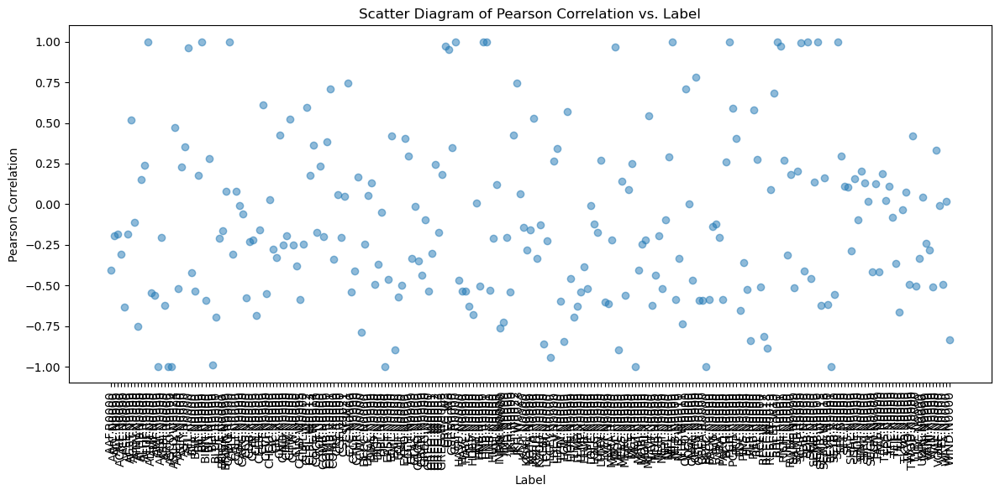

In [24]:
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'correlation_df' with 'Label' and 'Pearson Correlation' columns
plt.figure(figsize=(12, 6))

# Plot the scatter diagram
plt.scatter(correlation_df['Label'], correlation_df['Pearson Correlation'], alpha=0.5)
plt.title('Scatter Diagram of Pearson Correlation vs. Label')
plt.xlabel('Label')
plt.xticks(rotation=90)
plt.ylabel('Pearson Correlation')

plt.tight_layout()
plt.show()

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a figure and axis
fig, ax = plt.subplots(figsize=(120, 90))

# Get a list of unique labels
unique_labels = result_df['Label'].unique()

# Create a separate line for each label and label it
for label in unique_labels:
    # Filter the data for the current label
    label_data = result_df[result_df['Label'] == label]

    # Calculate a decimal year for x-axis
    decimal_year = label_data['Year'] + label_data['Month'] / 12

    # Plot the data for the current label and label it with the label name
    ax.plot(decimal_year, label_data['Close (Rs.)'], label=label)
    ax.text(decimal_year.iloc[-1], label_data['Close (Rs.)'].iloc[-1], label, fontsize=2, va='center')

# Customize the plot (labels, title, etc.)
ax.set_xlabel('Year')
ax.set_ylabel('Close (Rs.)')
ax.set_title('Close (Rs.) for Different Labels')

# Show the plot
plt.grid(True)
plt.show()

KeyError: 'Label'

In [26]:
# Step 3: Create a date range from January 2000 to August 2023
date_range = pd.date_range(start='2000-01-01', end='2023-08-01', freq='M')

# Step 4: Group by label and check for missing months
def check_missing_months(group):
    label = group['Label'].iloc[0]
    date_set = set(group.apply(lambda x: (x['Year'], x['Month']), axis=1))
    missing_dates = [date for date in date_range if (date.year, date.month) not in date_set]
    if len(missing_dates) == 0:
        return group
    else:
        return None

filtered_df = merged_df.groupby('Label').apply(check_missing_months)

# Step 5: Filter out labels that do not have records for all 283 months
filtered_df = filtered_df.dropna().reset_index(drop=True)

# Save the result to a new CSV file
filtered_df.to_csv('filtered_data.csv', index=False)

In [35]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Initialize an empty list to store the dataframes
dataframes = []

# Read the CSV file into a DataFrame
data_df = pd.read_csv('./all_data.csv')

# Create a figure and axis
fig, ax = plt.subplots(figsize=(120, 90))

# Get a list of unique labels
unique_labels = data_df['Label'].unique()

# Create a separate line for each label and label it
for label in unique_labels:
    # Filter the data for the current label
    label_data = data_df[data_df['Label'] == label]

    # Calculate a decimal year for x-axis
    decimal_year = label_data['Year'] + label_data['Month'] / 12

    # Plot the data for the current label and label it with the label name
    ax.plot(decimal_year, label_data['Close (Rs.)'], label=label)
    ax.text(decimal_year.iloc[-1], label_data['Close (Rs.)'].iloc[-1], label, fontsize=2, va='center')

# Customize the plot (labels, title, etc.)
ax.set_xlabel('Year')
ax.set_ylabel('Close (Rs.)')
ax.set_title('Close (Rs.) for Different Labels')

# Show the plot
plt.grid(True)
plt.show()